In [0]:
%%capture
!pip3 install numpy matplotlib
!pip3 install https://sigproc.mit.edu/_static/fall19/software/lib6003-0.0.4.tar.gz

import matplotlib.pyplot as plt

from math import e, pi, sin, cos, log, floor, ceil
j = 1j

from lib6003.audio import *
import numpy as np
from IPython.display import Audio


In [43]:
# Setup of input file
# filename = 'sinusoid.wav'
filename = 'loch.wav'
# filename = 'note.wav'
signal, fs = wav_read(filename)

# In-key notes
# in_key = [16.35, 18.35, 20.60, 21.83, 24.50, 27.50, 30.87, 32.70, 36.71, 41.20, 43.65, 49.00, 55.00, 61.74, 65.41, 73.42, 82.41, 87.31, 98.00, 110.0, 123.5, 130.8, 146.8, 164.8, 174.6, 196.0, 220.0, 246.9, 261.6, 293.7, 329.6, 349.2, 392.0, 440.0, 493.9, 523.3, 587.3, 659.3, 698.5, 784.0, 880.0, 987.8, 1047, 1175, 1319, 1397, 1568, 1760, 1976, 2093, 2349, 2637, 2794, 3136, 3520, 3951, 4186, 4699, 5274, 5588, 6272, 7040, 7902]
# in_key = [16.35, 32.70, 65.41, 130.8, 261.6, 523.3, 1047, 2093, 4186]
in_key = [261]
# in_key = [16.35,17.32,19.45,21.83,23.12,25.96,29.14,32.70,34.65,38.89,43.65,46.25,51.91,58.27,65.41,69.30,77.78,87.31,92.50,103.8,116.5,130.8,138.6,155.6,174.6,185.0,207.7,233.1,261.6,277.2,311.1,349.2,370.0,415.3,466.2,523.3,554.4,622.3,698.5,740.0,830.6,932.3,1047,1109,1245,1397,1480,1661,1865,2093,2217,2489,2794,2960,3322,3729,4186,4435,4978,5588,5920,6645,7459]

/usr/local/lib/python3.6/dist-packages/lib6003/wavfile.py:302: WavFileWarning: Chunk (non-data) not understood, skipping it.
  "Chunk (non-data) not understood, skipping it.", WavFileWarning


In [0]:
def resample(signal, scale_amount, target_size=None):
    '''
    resample a signal with linear interpolation
    '''
    resampled = []
    if target_size is None:
        target_size=int(round(len(signal)*scale_amount))
    for k in range(target_size):
        k_s = k / scale_amount
        k_prev = floor(k_s) # integer before
        k_next = ceil(k_s) # integer after
        k_prev = k_prev if k_prev < len(signal) else len(signal) - 1
        k_next = k_next if k_next < len(signal) else len(signal) - 1
        resampled.append((k_s - k_prev)*(signal[k_next] - signal[k_prev]) + signal[k_prev])
    return resampled

In [0]:
def find_peaks(signal, threshold, min_spacing):
  x = signal.tolist()
  output = []
  xmax = max(x)
  while xmax > threshold:
    idx = x.index(xmax)
    output.append(idx)
    # print(f'{idx} : {round(x[max(idx-1, 0)])} [{round(x[idx])}] {round(x[min(idx+1, len(x)-1)])}')
    for i in range(max(0, idx-min_spacing+1), min(idx+min_spacing, len(x))):
      x[i] = 0
    xmax = max(x)
  # print(sorted(output))
  return sorted(output)[0]

In [0]:
dft_data = []

In [0]:
def find_peaks2(signal):
  # print(signal)
  plt.figure()
  plt.yscale('log')
  plt.plot(signal)
  plt.show()
  return 2

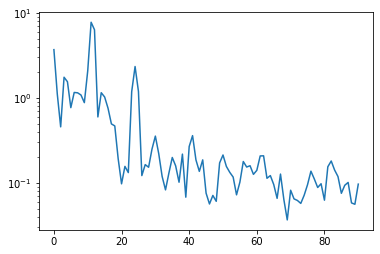

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:53: ComplexWarning: Casting complex values to real discards the imaginary part


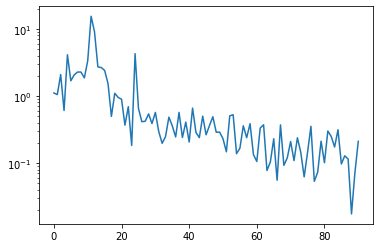

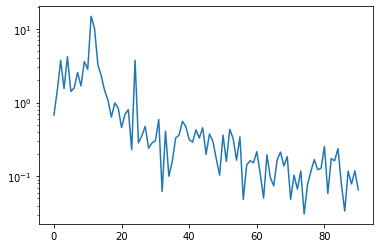

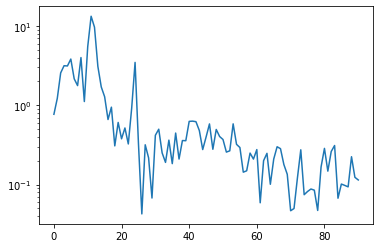

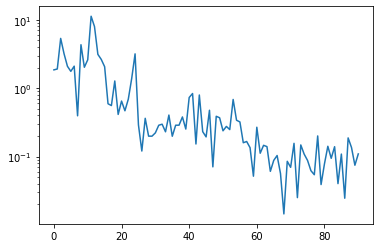

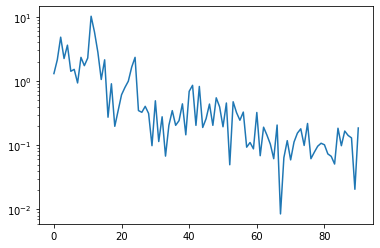

...

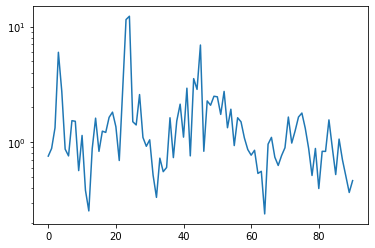

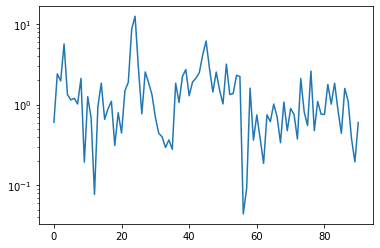

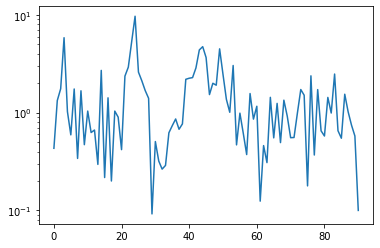

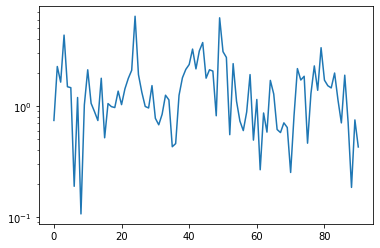

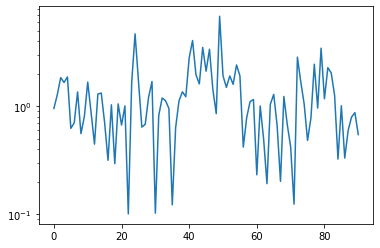

In [65]:
dft_size = 4096
step_size_analysis = dft_size//4
t_a = step_size_analysis/fs

num_ffts = (len(signal) - dft_size)//step_size_analysis+ 1

# window = np.ones(dft_size)
window = np.hanning(dft_size) 

last_phase_synthesis = np.zeros(dft_size)
last_phase_analysis = np.zeros(dft_size)
bin_freq = np.array([k*2*pi/dft_size for k in range(dft_size)])

autotuned = np.zeros(len(signal))

for bin in range(num_ffts):
    sample = signal[bin*step_size_analysis:bin*step_size_analysis+dft_size]
    dft = np.fft.fft(np.multiply(sample, window))

    mag = abs(dft)
    phase = np.arctan2(dft.imag, dft.real)
    last_phase_analysis = phase
    
    # ignore DC component
    # k_max = mag[1:24].argmax(axis=0)+1
    k_cutoff = int(1000*dft_size/fs)
    k_max = find_peaks2(mag[1:k_cutoff])
    k_max = find_peaks(mag[1:k_cutoff], max(mag[1:k_cutoff])/4, 15) + 1

    k_max *= 2
    f_max = k_max/dft_size*fs
    # print("calculated f_max")
    f_n = lambda n: (phase[k_max] - last_phase_analysis[k_max] + 2*pi*n)/(2*pi*t_a)
    fundamental = f_n(min(range(step_size_analysis), key=lambda n: abs(f_n(n) - f_max)))
    # print(fundamental)

    note = min(in_key, key=lambda f0: abs(f0 - fundamental))
    scale_factor = note/fundamental
    scale_factor = 1.7
    # print(scale_factor)
    
    phase = last_phase_synthesis + 2*pi*fundamental*t_a

    # corrected_dft = resample(np.multiply(mag, np.exp(j*phase)), scale_factor)
    corrected_dft = resample(dft, scale_factor)
    # window = np.hanning(dft_size)
    window = np.ones(dft_size)
    new_signal = np.multiply(resample(np.fft.ifft(corrected_dft), 1/scale_factor, dft_size), window)/(dft_size/step_size_analysis)

    start = int(bin*step_size_analysis)
    end = start + len(new_signal)
    # print(len(new_signal))
    autotuned[start:end] = np.add(autotuned[start:end], new_signal)

#resampled_signal = resample(autotuned, 1/scale_factor)

Audio(autotuned, rate=44100, autoplay=True)
# wav_write(autotuned, fs, f'{filename.split(".")[0]}_shifted_CMaj.wav')


In [145]:
Audio("note.wav")

In [0]:
def disp_data(data):
  plt.figure()
  plt.yscale('log')
  for d in data:
    plt.plot(signal)
    plt.show()

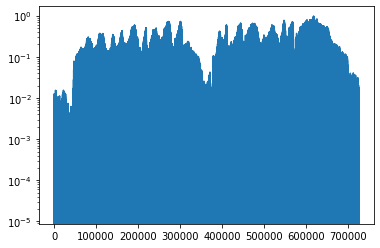

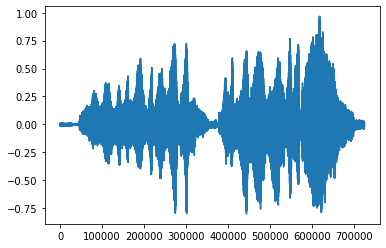

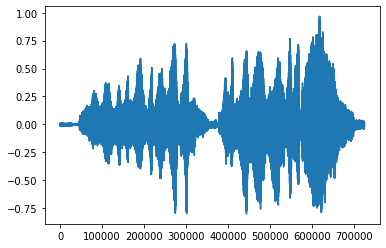

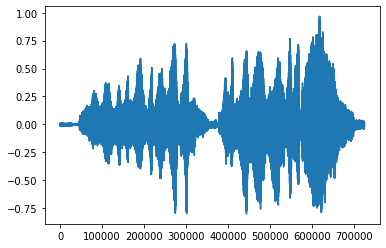

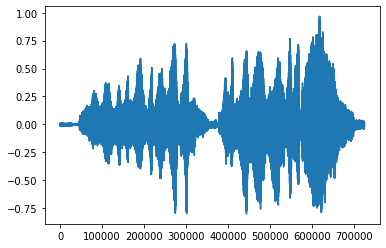

...

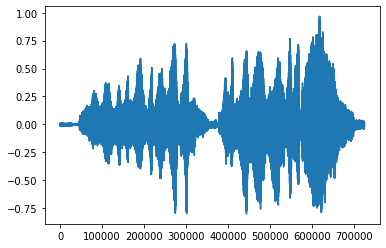

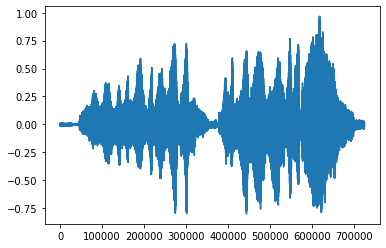

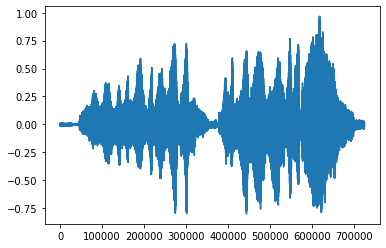

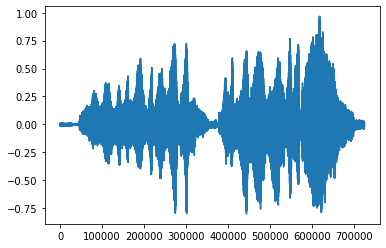

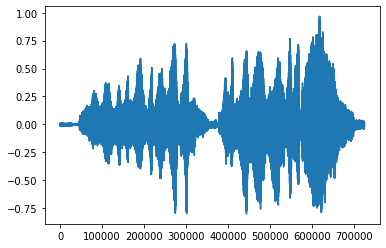

KeyboardInterrupt: ignored

In [68]:
disp_data(dft_data)